In [1]:
import os

experiment_path = './data/Kinematic Experiment #2'

if not os.path.exists(experiment_path):
    os.makedirs(experiment_path)

In [2]:
from map_maker import cluttered_map, save_map
from Turtlebot_Kinematics import *
from environment import Environment, load_ENV
from Runner import ControllMode, Runner
from pso_controller import Multi_PSO_Controller
from dwa_controller import DWA_Controller

kinematics = [unicycleKin, difDriveKin, droneKin]

run_num = 31
dt = 0.1
max_index = None

# map parameters
map_obs = 8
map_size = 50
map_unknown = False
map_name = f"cluttered_{map_obs}obs_{map_size}x{map_size}_{'unknown' if map_unknown else 'known'}"

for i in range(run_num):
    # create run foder
    run_path = f"{experiment_path}/{i}"
    if not os.path.exists(run_path):
        os.makedirs(run_path)
    for kin in kinematics:  
        # create run foder
        run_path = f"{experiment_path}/{i}/{kin.__name__}"
        if not os.path.exists(run_path):
            os.makedirs(run_path)

        # create and save map
        run_map = cluttered_map(map_obs, map_size, map_unknown)
        map_path = f"{run_path}/{map_name}"
        save_map(run_map, map_name, run_path)

        # run and save long MultiPSO data
        kinematic = kin()
        long_MultiPSO_ENV = Environment.from_dict(run_map, kinematic, record=True)
        long_MultiPSO_controller = Multi_PSO_Controller(5, kinematic, 10, 0.75, 10)
        if max_index is None:
            max_index = long_MultiPSO_ENV.goal_travel_time / dt + 200
        else: max_index = max(max_index, long_MultiPSO_ENV.goal_travel_time / dt + 200)
        long_MultiPSO_Runner = Runner(
            long_MultiPSO_ENV, 
            ControllMode.MultiPSO, 
            long_MultiPSO_controller, 
            max_step = max_index,
            dt = dt,
            save_path= f"{run_path}/long_MultiPSO_data"
        )
        long_MultiPSO_Runner.loop()

        # run and save short MultiPSO data
        kinematic = kin()
        short_MultiPSO_ENV = Environment.from_dict(run_map, kinematic, record=True)
        short_MultiPSO_controller = Multi_PSO_Controller(10, kinematic, 5, 1.5, 10)
        if max_index is None:
            max_index = short_MultiPSO_ENV.goal_travel_time / dt + 200
        else: max_index = max(max_index, short_MultiPSO_ENV.goal_travel_time / dt + 200)
        short_MultiPSO_Runner = Runner(
            short_MultiPSO_ENV, 
            ControllMode.MultiPSO, 
            short_MultiPSO_controller, 
            max_step = max_index,
            dt = dt,
            save_path= f"{run_path}/short_MultiPSO_data"
        )
        short_MultiPSO_Runner.loop()

        # run and save DWA data
        kinematic = kin()
        DWA_ENV = Environment.from_dict(run_map, kinematic, record=True)
        DWA_controller = DWA_Controller(20, kinematic, virtual_dt=2.0)
        DWA_controller.heading_koeff = 30
        DWA_controller.speed_koeff = 30
        DWA_Runner = Runner(
            DWA_ENV, 
            ControllMode.DWA, 
            DWA_controller, 
            max_step = max_index,
            dt = dt,
            save_path= f"{run_path}/DWA_data"
        )
        DWA_Runner.loop()


pygame 2.5.2 (SDL 2.28.3, Python 3.10.11)
Hello from the pygame community. https://www.pygame.org/contribute.html
# 1
stepping (3.0016563771807965, -0.6949548909426156)
# 2
stepping (3.879480900810547, -0.7139221518563179)
# 3
stepping (4.522555078843742, -0.7258836375063834)
# 4
stepping (4.943985428060822, -0.7325639298392688)
# 5
stepping (5.165800101202841, -0.7349820937762015)
# 6
stepping (5.2146585392037235, -0.7337573725939905)
# 7
stepping (5.118807112214897, -0.7293048441520565)
# 8
stepping (4.9059994481548665, -0.7219542698996063)
# 9
stepping (4.602152240195971, -0.7120165987412274)
# 10
stepping (4.230551618633311, -0.6998158977740371)
# 11
stepping (3.81146249450162, -0.6856994231360828)
# 12
stepping (15.0, -0.9)
# 13
stepping (2.8963435208790114, -0.6532001198595333)
# 14
stepping (2.425710423305504, -0.6355719492289132)
# 15
stepping (1.9588928085428794, -0.6175122831606377)
# 16
stepping (1.502463080804, -0.5993575265669273)
# 17
stepping (1.0611341317569671, -0.5814

c:\Users\User\.pyenv\pyenv-win\versions\3.10.11\lib\site-packages\shapely\set_operations.py:76: RuntimeWarning: divide by zero encountered in difference
  return lib.difference(a, b, **kwargs)


# 1
stepping (13.09142136824904, 9.809476065888141)
# 2
stepping (3.8743491968165276, -1.6789734568655956)
# 3
stepping (3.7397669071563038, -0.38168240391520714)
# 4
stepping (3.8243621662218983, 0.8243747552923473)
# 5
stepping (4.079866743672549, 1.9031391300796536)
# 6
stepping (4.46496516102353, 2.836301907543302)
# 7
stepping (4.944074128858151, 3.618213384188943)
# 8
stepping (5.486553701207518, 4.251981238433651)
# 9
stepping (6.066178232940807, 4.746498524283826)
# 10
stepping (6.66075252044994, 5.1142025446566155)
# 11
stepping (7.251799776013277, 5.369409699416452)
# 12
stepping (7.8242772366251705, 5.527103860067187)
# 13
stepping (8.36629528824313, 5.602080358622137)
# 14
stepping (8.86882936324577, 5.608366679611455)
# 15
stepping (9.325422366521607, 5.558856002633602)
# 16
stepping (9.731880398253274, 5.465101915501195)
# 17
stepping (10.085967124541238, 5.337232608872316)
# 18
stepping (10.38710309036989, 5.183951146182567)
# 19
stepping (10.636076156053129, 5.012595303

c:\Users\User\.pyenv\pyenv-win\versions\3.10.11\lib\site-packages\shapely\set_operations.py:76: RuntimeWarning: divide by zero encountered in difference
  return lib.difference(a, b, **kwargs)


stepping (21.372520105468013, -4.167620300603293)
# 3
stepping (21.108368359546077, -3.537465136620037)
# 4
stepping (17.077368512312226, 2.413724866626191)
# 5
stepping (12.623056456829337, 7.392897871573973)
# 6
stepping (12.87216000014694, 7.251464705296852)
# 7
stepping (13.117196713003281, 7.109140650187012)
# 8
stepping (13.353357499962, 6.959976566689978)
# 9
stepping (13.577073102828592, 6.799520463676009)
# 10
stepping (13.785811619314282, 6.62458075219142)
# 11
stepping (13.977902734397535, 6.433019776014765)
# 12
stepping (14.152385566057191, 6.22357420155228)
# 13
stepping (14.308877356420219, 5.995699204564528)
# 14
stepping (14.447460535866318, 5.749433711443659)
# 15
stepping (14.56858595438807, 5.485284241506154)
# 16
stepping (14.672990314358534, 5.20412515698429)
# 17
stepping (14.761626054387804, 4.907113361778233)
# 18
stepping (19.27418579869711, 9.205618261079335)
# 19
stepping (18.3984314760727, 6.412640287407397)
# 20
stepping (18.214155042345435, 5.381687423294

c:\Users\User\.pyenv\pyenv-win\versions\3.10.11\lib\site-packages\shapely\set_operations.py:76: RuntimeWarning: divide by zero encountered in difference
  return lib.difference(a, b, **kwargs)


# 1
best: 58.374517251019014 (20.997142765754088, 7.208328216343973)
stepping (20.997142765754088, 7.208328216343973)
# 2
best: 57.878637845989545 (20.997142765754088, 7.208328216343973)
stepping (20.997142765754088, 7.208328216343973)
# 3
best: 53.47981393285006 (20.997142765754088, 7.208328216343973)
stepping (20.997142765754088, 7.208328216343973)
# 4
best: 50.797798701037166 (17.518919308599937, 13.635522221710625)
stepping (17.518919308599937, 13.635522221710625)
# 5
best: 48.965047592569846 (17.518919308599937, 13.635522221710625)
stepping (17.518919308599937, 13.635522221710625)
# 6
best: 47.214521703916404 (17.518919308599937, 13.635522221710625)
stepping (17.518919308599937, 13.635522221710625)
# 7
best: 45.579595873411506 (17.518919308599937, 13.635522221710625)
stepping (17.518919308599937, 13.635522221710625)
# 8
best: 44.068334271554804 (17.518919308599937, 13.635522221710625)
stepping (17.518919308599937, 13.635522221710625)
# 9
best: 44.256363399729864 (20.99714276575408

In [3]:
import numpy as np

max_index = int(np.ceil(max_index))
print("Max_index:", max_index)


Max_index: 567


In [4]:
import pandas
from pandas import DataFrame
import matplotlib.pyplot as plt

In [5]:
def fill_df(df, length, di):
    index = df.index[-1]
    last_loc = df.iloc[-1]
    while len(df) < length:
        index += di
        df.loc[index] = last_loc
    return df

def build_loc(goal_dists, obst_dists):
    return {
        "goal_dists": goal_dists,
        "obst_dists": obst_dists
    }

In [6]:
kin_frame_dict = {}
for kin in kinematics:
    kin_frame_dict[kin.__name__] = (
        DataFrame(columns=["goal_dists", "obst_dists"]), #long
        DataFrame(columns=["goal_dists", "obst_dists"]), #short
        DataFrame(columns=["goal_dists", "obst_dists"])  #DWA
    )

def append_to_total_df(total_df, file_name, max_index, dt):
    df = pandas.read_hdf(file_name)
    goal_dists = fill_df(df["goal_dist"], max_index, dt)
    obst_dists = fill_df(df["obst_dist"], max_index, dt)
    total_df.loc[i] = build_loc(goal_dists, obst_dists)

for i in range(run_num):
    for kin in kinematics:
        long_Multi_PSO_df, short_Multi_PSO_df, DWA_df = kin_frame_dict[kin.__name__]
        append_to_total_df(long_Multi_PSO_df, f"{experiment_path}/{i}/{kin.__name__}/long_MultiPSO_data.h5", max_index, dt)
        append_to_total_df(short_Multi_PSO_df, f"{experiment_path}/{i}/{kin.__name__}/short_MultiPSO_data.h5", max_index, dt)
        append_to_total_df(DWA_df, f"{experiment_path}/{i}/{kin.__name__}/DWA_data.h5", max_index, dt)
    



In [7]:
def get_eval_arrays(total_df, max_index):
    print(total_df.iloc[0])
    avg_goal = list([np.average([total_df.iloc[i]["goal_dists"].iloc[j] for i in range(run_num)])for j in range(max_index)])
    avg_obst = list([np.average([total_df.iloc[i]["obst_dists"].iloc[j] for i in range(run_num)])for j in range(max_index)])
    min_obst = list([np.min([total_df.iloc[i]["obst_dists"].iloc[j] for i in range(run_num)])for j in range(max_index)])
    return avg_goal, avg_obst, min_obst


goal_dists    0.0       0.000000
0.1       1.063763
0.2     ...
obst_dists    0.0     0.157993
0.1     0.168776
0.2     0.18...
Name: 0, dtype: object
goal_dists    0.0      0.000000
0.1      2.862407
0.2      5...
obst_dists    0.0     0.157993
0.1     0.097847
0.2     0.04...
Name: 0, dtype: object
goal_dists    0.0       0.000000
0.1       1.863636
0.2     ...
obst_dists    0.0     0.157993
0.1     0.138944
0.2     0.11...
Name: 0, dtype: object
goal_dists    0.0      0.000000
0.1      2.349032
0.2      4...
obst_dists    0.0     2.360086
0.1     2.379926
0.2     2.36...
Name: 0, dtype: object
goal_dists    0.0      0.000000
0.1      0.484901
0.2      1...
obst_dists    0.0     2.360086
0.1     2.267115
0.2     2.20...
Name: 0, dtype: object
goal_dists    0.0       0.000000
0.1       1.901340
0.2     ...
obst_dists    0.0     2.360086
0.1     2.352947
0.2     2.34...
Name: 0, dtype: object
goal_dists    0.0      0.000000
0.1      0.509346
0.2      1...
obst_dists    0.0     3.125000

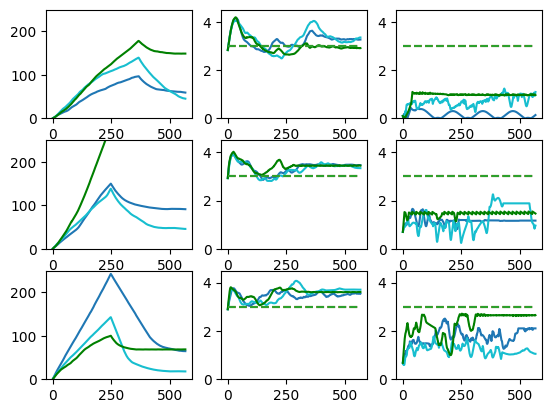

In [11]:
def plot_eval_row(axs, total_df, color="blue"):
    avg_goal, avg_obst, min_obst = get_eval_arrays(total_df, max_index)
    axs[0].plot(avg_goal, color=color)
    axs[0].set_ylim(top=250)
    axs[1].plot(avg_obst, color=color)
    axs[1].plot([3]*len(avg_obst), linestyle="--")
    axs[1].set_ylim(top=4.5)
    axs[2].plot(min_obst, color=color) 
    axs[2].plot([3]*len(min_obst), linestyle="--")
    axs[2].set_ylim(top = axs[1].get_ylim()[1])
    for ax in axs:
        ax.set_ylim(bottom = 0.0)

fig, axs = plt.subplots(len(kinematics),3)
for kin, ax_row in zip(kinematics, axs):
    long_Multi_PSO_df, short_Multi_PSO_df, DWA_df = kin_frame_dict[kin.__name__]
    plot_eval_row(ax_row, long_Multi_PSO_df, "tab:blue")
    plot_eval_row(ax_row, short_Multi_PSO_df, "tab:cyan")
    plot_eval_row(ax_row, DWA_df, "green")


In [9]:
df = pandas.read_hdf("data\Map Experiment #2\9\DWA_data.h5")
print(df)
max_index

          robo_x      robo_y  robo_deg      goal_x  goal_y   goal_dist  \
0.0    50.000000  300.000000  0.000000   50.000000   300.0    0.000000   
0.1    51.542745  299.996242 -0.004872   51.363636   300.0    0.179148   
0.2    53.018691  299.999993 -0.009533   52.727273   300.0    0.291418   
0.3    54.449510  300.010400 -0.014051   54.090909   300.0    0.358752   
0.4    55.960577  300.028028 -0.018823   55.454545   300.0    0.506807   
...          ...         ...       ...         ...     ...         ...   
56.3  279.024862  305.335500 -0.226861  550.000000   300.0  271.027660   
56.4  279.102567  305.357246 -0.134841  550.000000   300.0  270.950400   
56.5  279.183546  305.364430 -0.227553  550.000000   300.0  270.869579   
56.6  279.258533  305.385340 -0.138776  550.000000   300.0  270.795021   
56.7  279.340058  305.392869 -0.232144  550.000000   300.0  270.713663   

      obst_dist  
0.0    3.125000  
0.1    3.221422  
0.2    3.313668  
0.3    3.403094  
0.4    3.497536  
...

567